In [2]:
import os 
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random

import splitfolders

import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator

from keras.models import Sequential
from keras.layers import Dense,Conv2D,Dropout,Flatten,MaxPooling2D, BatchNormalization,Input,concatenate
from keras.callbacks import EarlyStopping,ReduceLROnPlateau
from keras.utils import plot_model

from sklearn.metrics import classification_report, confusion_matrix

In [3]:
# Path where our data is located
base_path = "C:/Users/Dell/Downloads/ASLdata/train/"

# Dictionary to save our 29 classes
categories = {  0: "A",
                1: "B",
                2: "C",
                3: "D",
                4: "E",
                5: "F",
                6: "G",
                7: "H",
                8: "I",
                9: "G",
                10: "K",
                11: "L",
                12: "M",
                13: "N",
                14: "O",
                15: "P",
                16: "Q",
                17: "R",
                18: "S",
                19: "T",
                20: "U",
                21: "V",
                22: "W",
                23: "X",
                24: "Y",
                25: "Z",
                26: "del",
                27: "nothing",
                28: "space",
            }

def add_class_name_prefix(df, col_name):
    df[col_name]
    return df


# list conatining all the filenames in the dataset
filenames_list = []
# list to store the corresponding category, note that each folder of the dataset has one class of data
categories_list = []

for category in categories:
    filenames = os.listdir(base_path + categories[category])
    filenames_list = filenames_list + filenames
    categories_list = categories_list + [category] * len(filenames)

df = pd.DataFrame({"filename": filenames_list, "category": categories_list})
df = add_class_name_prefix(df, "filename")

# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)

In [4]:
df


,filename,category
0,space551.jpg,28
1,D1209.jpg,3
2,Y701.jpg,24
3,Z2409.jpg,25
4,S1741.jpg,18
...,...,...
34795,del2196.jpg,26
34796,M1703.jpg,12
34797,A189.jpg,0
34798,B962.jpg,1


In [5]:
print("number of elements = ", len(df))


number of elements =  34800


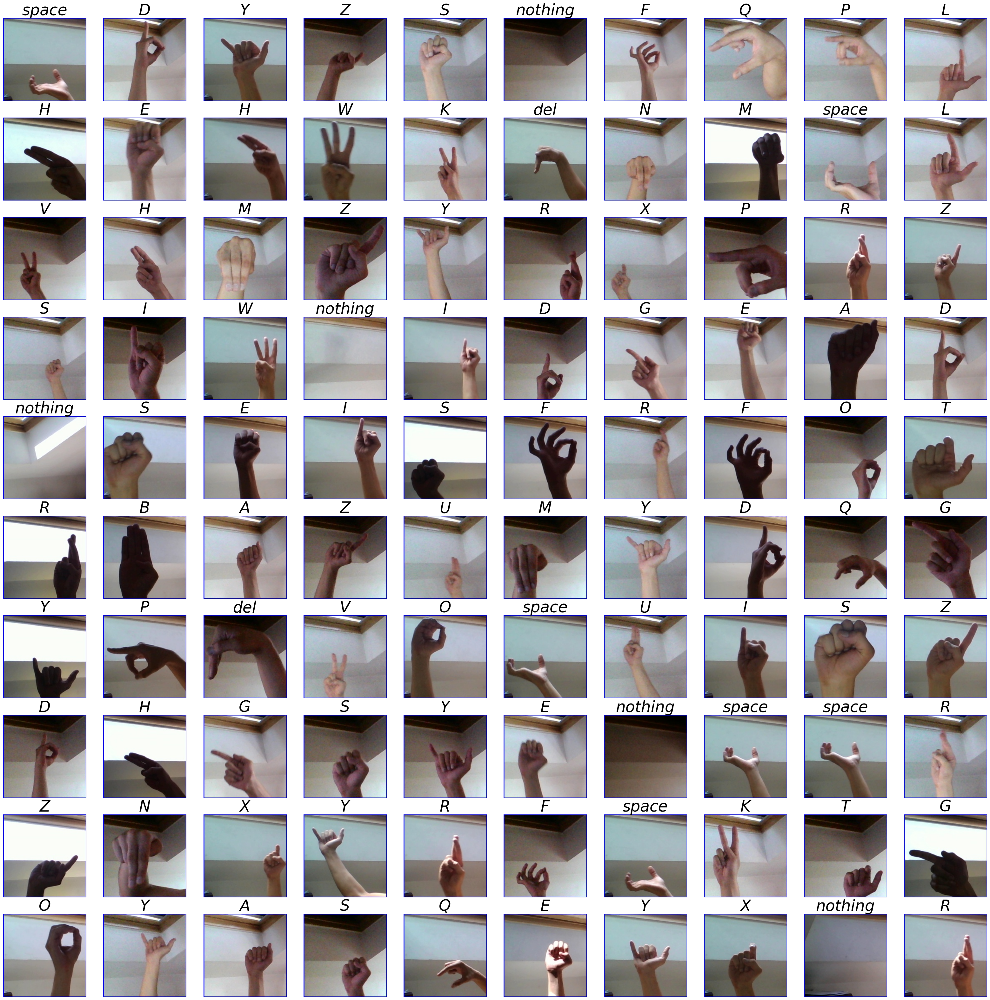

In [6]:
plt.figure(figsize=(40,40))

for i in range(100):
    path = ""
    path = os.path.join(base_path, categories[df.category[i]], df.filename[i])
    img = plt.imread(path)
    plt.subplot(10,10, i + 1)
    plt.imshow(img)
    plt.title(categories[df.category[i]],fontsize=35,fontstyle='italic')
    plt.axis("off")

In [12]:
splitfolders.ratio('C:/Users/Dell/Downloads/ASLdata/train',output='C:/Users/Dell/Downloads/ASLdataset/', seed=1333, ratio=(0.8,0.1,0.1))

Copying files: 34800 files [03:52, 149.46 files/s]


In [7]:
datagen = ImageDataGenerator(rescale= 1.0 / 255)

In [8]:
train_path = 'C:/Users/Dell/Downloads/ASLdataset/train'
val_path = 'C:/Users/Dell/Downloads/ASLdataset/val'
test_path = 'C:/Users/Dell/Downloads/ASLdataset/test'

batch = 32
image_size = 200
img_channel = 3
n_classes = 29

In [9]:
train_data = datagen.flow_from_directory(directory= train_path, 
                                         target_size=(image_size,image_size), 
                                         batch_size = batch, 
                                         class_mode='sparse')

val_data = datagen.flow_from_directory(directory= val_path, 
                                       target_size=(image_size,image_size), 
                                       batch_size = batch, 
                                       class_mode='sparse',
                                       )

test_data = datagen.flow_from_directory(directory= test_path, 
                                         target_size=(image_size,image_size), 
                                         batch_size = batch, 
                                         class_mode='sparse',
                                         shuffle= False)

Found 27840 images belonging to 29 classes.
Found 3480 images belonging to 29 classes.
Found 3480 images belonging to 29 classes.


In [10]:
model = Sequential()
# input layer
# Block 1
model.add(Conv2D(32,3,activation='relu',padding='same',input_shape = (image_size,image_size,img_channel)))
model.add(Conv2D(32,3,activation='relu',padding='same'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.1))

# Block 2
model.add(Conv2D(64,3,activation='relu',padding='same'))
model.add(Conv2D(64,3,activation='relu',padding='same'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.2))

#Block 3
model.add(Conv2D(128,3,activation='relu',padding='same'))
model.add(Conv2D(128,3,activation='relu',padding='same'))
#model.add(BatchNormalization())
#model.add(MaxPooling2D(padding='same'))
model.add(Dropout(0.3))

# fully connected layer
model.add(Flatten())

model.add(Dense(512,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(128,activation='relu'))
model.add(Dropout(0.2))

# output layer
model.add(Dense(29, activation='softmax'))



model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 200, 200, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 200, 200, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 100, 100, 32)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 100, 100, 32)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 100, 100, 64)      18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 100, 100, 64)      36928     
                                                        

In [11]:
early_stoping = EarlyStopping(monitor='val_loss', 
                              min_delta=0.01,
                              patience= 3,
                              restore_best_weights= True, 
                              verbose = 1)

reduce_learning_rate = ReduceLROnPlateau(monitor='val_accuracy', 
                                         patience = 2, 
                                         factor=0.5 , 
                                         verbose = 1)

In [13]:
from keras.optimizers import Adamax

# Define the Adamax optimizer
optimizer_adamax = Adamax(learning_rate=0.01, beta_1=0.9, beta_2=0.999)

# Compile the model with Adam and Adamax optimizers and a different loss function
model.compile(optimizer=optimizer_adamax, loss='sparse_categorical_crossentropy', metrics=['accuracy'])


In [14]:
asl_class = model.fit(train_data, 
                      validation_data= val_data, 
                      epochs=10, 
                      callbacks=[early_stoping,reduce_learning_rate],
                      verbose = 1)

Epoch 1/10
870/870 [==============================] - 5773s 7s/step - loss: 49.4017 - accuracy: 0.0336 - val_loss: 3.3676 - val_accuracy: 0.0345 - lr: 0.0100
Epoch 2/10
870/870 [==============================] - 5808s 7s/step - loss: 3.3684 - accuracy: 0.0343 - val_loss: 3.3676 - val_accuracy: 0.0345 - lr: 0.0100
Epoch 3/10
870/870 [==============================] - ETA: 0s - loss: 3.3683 - accuracy: 0.0315
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.004999999888241291.
870/870 [==============================] - 6829s 8s/step - loss: 3.3683 - accuracy: 0.0315 - val_loss: 3.3676 - val_accuracy: 0.0345 - lr: 0.0100
Epoch 4/10
870/870 [==============================] - 8906s 10s/step - loss: 3.3679 - accuracy: 0.0340 - val_loss: 3.3674 - val_accuracy: 0.0345 - lr: 0.0050
Epoch 4: early stopping


In [15]:
model.save('ASLmodel.h5')

c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
